In [21]:
from PIL import Image
import numpy as np
import pickle

In [19]:
def load_data(pack):
    with open(f'{pack}.pkl', 'rb') as file:
        data = pickle.load(file)
    return data

In [9]:
test = np.random.randint(0, 10, (4, 2, 2, 3))

In [124]:
test.shape

(4, 2, 2, 3)

In [125]:
np.append(test, 5, axis=-1).shape

ValueError: all the input arrays must have same number of dimensions, but the array at index 0 has 4 dimension(s) and the array at index 1 has 0 dimension(s)

In [30]:
test.max(axis=(-1, -2))

array([[8, 5],
       [5, 9],
       [4, 9],
       [9, 8]])

In [129]:
def draw(image, width, 
         save_as=None,
         pack='data/colors', 
         styles='all', 
         background=(0, 0, 0), 
         disp=True):

    esize = 50
    
    data = load_data(pack)

    # Creating indices for styles in RGBA matrices
    if styles == 'all' or not isinstance(styles, str):
        styles = 'tagf'
    style_indices = [i for i in range(4) 
                     if 'tagf'[i] in styles]
    if not style_indices:
        style_indices = [*range(4)]

    # Leave only data for specified styles
    matrices = data['matrices'][style_indices]
    # data['averages'] = data['averages'][style_indices]
    # data['areas'] = data['areas'][style_indices]

    # Preparing image
    source = Image.open(f'{image}').convert('RGBA')
    if disp:
        source_w, source_h = source.size
        print(f'Image size: {source_h}x{source_w}', end='')
    # Reducing image size and leave only RGB channels
    source.thumbnail((width, -1))
    source_w, source_h = source.size
    if disp:
        print(f' → {source_h}x{source_w}')
    # Result emoji art image size
    result_h, result_w = source_h * esize, source_w * esize

    # Get alpha values of RGBA pixels
    alphas = matrices[..., 3:] / 255

    # Add background to RGBA matrices
    if background is not None and background not in ('auto',):
        b_color = np.full(4, 255, dtype='uint8')
        b_color[:len(background)] = background

        matrices = (1 - alphas) * b_color + alphas * matrices
        matrices = np.round(matrices).astype('uint8')

        alphas = matrices[..., 3:] / 255
    
    # Calculate average colors of emojis
    weighted_sum = (matrices[..., :3] * alphas).sum(axis=(-2, -3))
    averages = weighted_sum / alphas.sum(axis=(-1, -2, -3))[..., None]
    
    source = np.array(source)
    # averages: (4, N, 3) -> (4, N, 3)
    # source:   (h, w, 3) -> (h, w, 1, 3)
    # sum:      (h, w, 4N)
    best_i = ((averages.reshape(-1, 3) - source[..., None, :3]) ** 2).sum(axis=-1).argmin(axis=-1)

    # matrices: (4, N, 50, 50, 4)
    # best_i:   (h, w)
    # result:   (h, w, 50, 50, 4) 
    result = matrices.reshape(-1, *matrices.shape[2:])[best_i]

    print(result.shape)
    if background == 'auto':
        # result: (h, w, 50, 50, 4) 
        # alphas: (h, w, 50, 50, 1)
        # source: (h, w, 3) -> (h, w, 1, 1, 3)
        # areas:  (h, w) -> (h, w, 1, 1, 1)
        alphas = result[..., 3:] / 255
        # result = result[..., :3]
        # np.insert(source, 4, 255, axis=-1)
        areas = alphas.sum(axis=(-1, -2, -3)) / esize / esize
        areas = areas[..., None, None, None]
        tiles = (source[..., None, None, :] - areas * result) / (1 - areas)

        result = (1 - alphas) * tiles + alphas * result
        result = np.clip(result, 0, 255)
        result = np.round(result).astype('uint8')
    
    # Reshaping to result
    result = result.transpose(0, 2, 1, 3, 4).reshape(result_h, result_w, 4)
    return Image.fromarray(result)

Image size: 1080x1080 → 50x50
(50, 50, 50, 50, 4)
CPU times: user 666 ms, sys: 283 ms, total: 948 ms
Wall time: 1.08 s


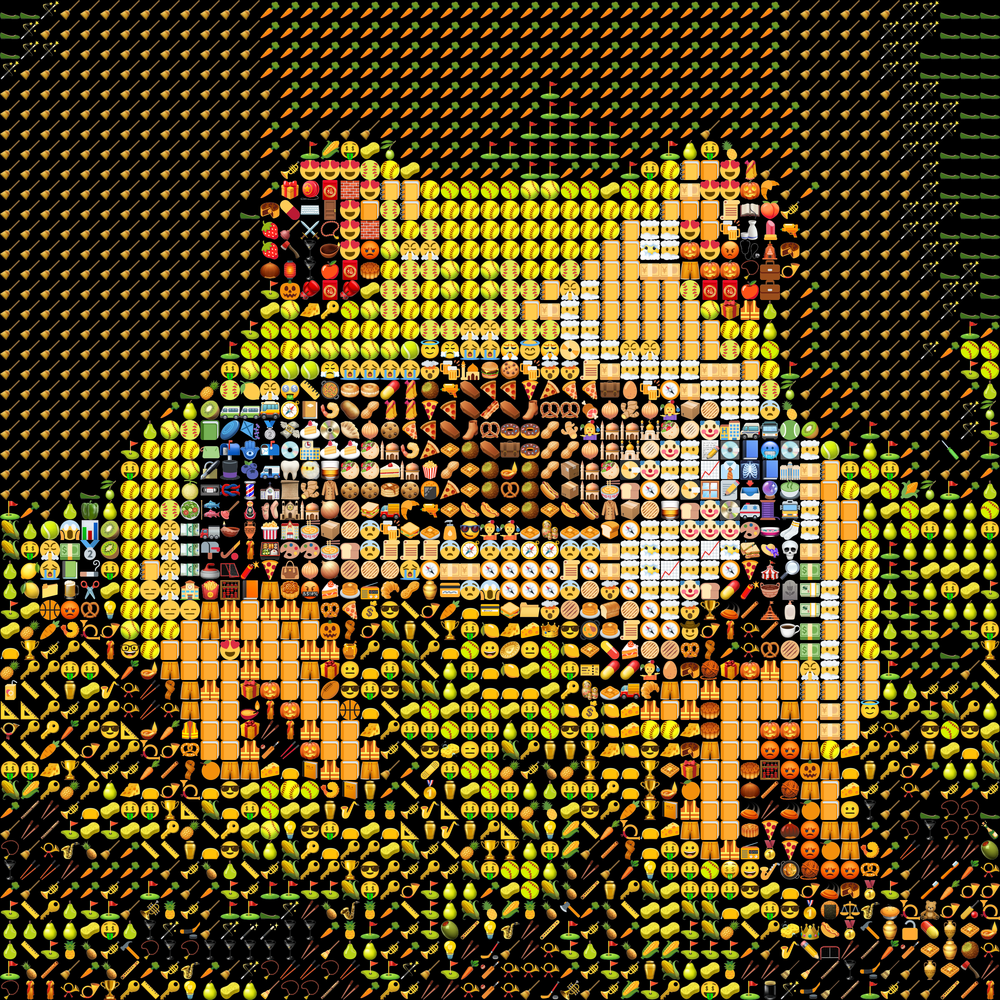

In [131]:
%%time
img = draw('images/frog.png', 50, pack='data/classic', 
           background=(0, 0, 0),
           # background='auto',
          )
img

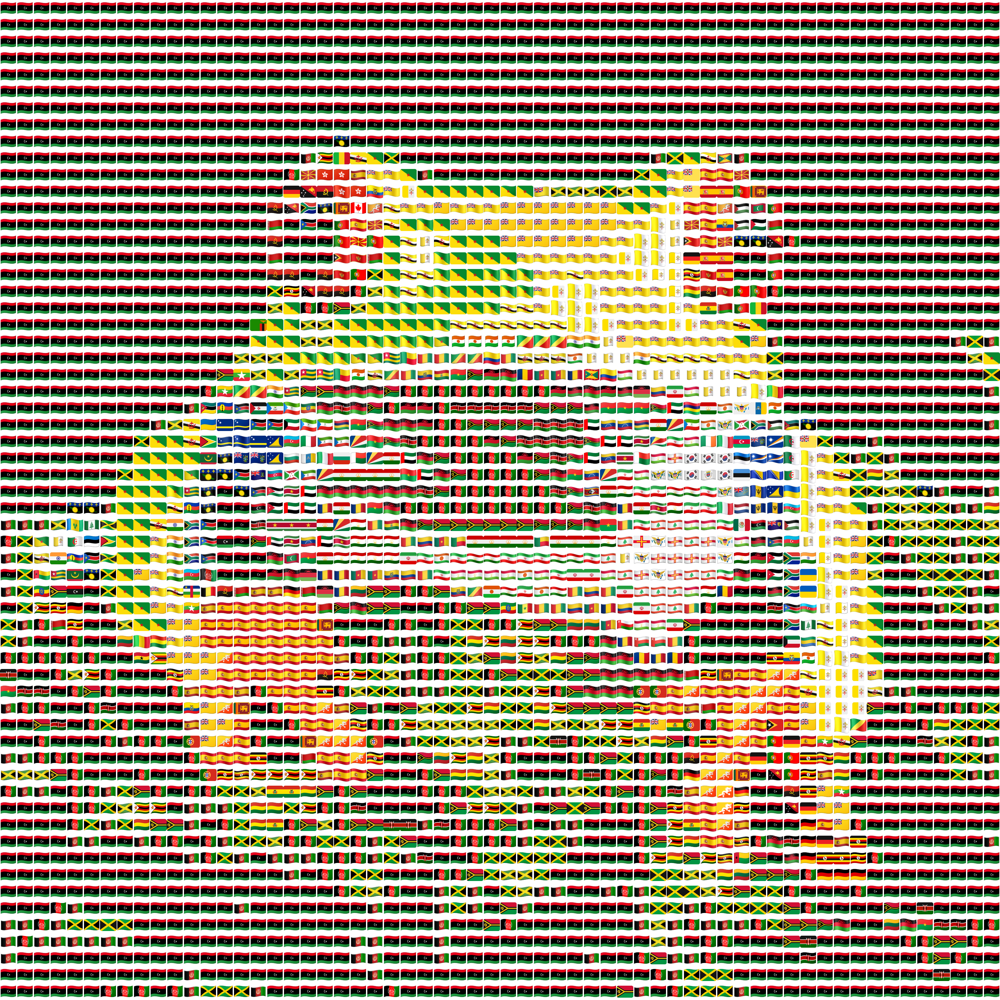

In [61]:
Image.fromarray(img.transpose(0, 2, 1, 3, 4).reshape(3000, 3000, 4))